In [1]:

import cv2
import easyocr
from PIL import Image
import numpy as np
from IPython.display import display
import google.generativeai as genai
from dotenv import load_dotenv
import os
import json
from rapidfuzz import fuzz
import re


load_dotenv()
reader = easyocr.Reader(['en'])  # Initialize once


c:\Users\funel\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


In [20]:
class DefaultResultHolder:
    def __init__(self):
        self.dest_start = 0
        self.dest_end = 0

def draw_ocr_annotations(image_path, results, output_path="ocr_annotated.png"):
    image = cv2.imread(image_path)
    for bbox, text, _ in results:
        pts = np.array(bbox, dtype=np.int32)
        pts = pts.reshape((-1, 1, 2))
        y_top = bbox[0][1]
        y_bottom = bbox[3][1]
        height = abs(y_bottom - y_top)
        cv2.polylines(image, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        x, y = pts[0][0]
        cv2.putText(image, f"{text} : {height}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    cv2.imwrite(output_path, image)
    print(f"✅ Annotated image saved: {output_path}")
    display(Image.open(output_path))
    return output_path

def draw_annotations_from_json(image_path, json_data, fx=1.0, fy=1.0, output_path="annotated_articles.png"):
    import json
    import cv2
    from PIL import Image

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"❌ Could not load image from: {image_path}")

    # Parse JSON
    try:
        articles = json.loads(json_data)
    except json.JSONDecodeError:
        raise ValueError("❌ Invalid JSON data")

    # Define annotation types and colors
    parts = {
        "headline": ((255, 0, 0), 2),       # Blue
        "byline": ((0, 255, 0), 2),    # Green
    }

    for article in articles.get("values", []):
        article_type = article.get("type")
        bbox = article.get("box_2d") or article.get("bounding_box") or article.get("bbox")

        if article_type in parts and bbox and len(bbox) == 4:
            color, thickness = parts[article_type]

            x1, y1, x2, y2 = bbox  # Assume bbox = [x1, y1, x2, y2]
            x1 = int(x1 / fx)
            y1 = int(y1 / fy)
            x2 = int(x2 / fx)
            y2 = int(y2 / fy)

            top_left = (x1, y1)
            bottom_right = (x2, y2)

            # Draw rectangle and label
            cv2.rectangle(image, top_left, bottom_right, color, thickness)
            cv2.putText(
                image,
                article_type.capitalize(),
                (x1, y1 - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                color,
                2
            )

    cv2.imwrite(output_path, image)
    Image.open(output_path).show()
    return output_path

def normalize_text(s):
    return " ".join(s.lower().split())


def remove_single_line_from_target(best_result, main_text):
    new_result = main_text[best_result.dest_start:best_result.dest_end]
    return main_text.replace(new_result, "")

def find_bbox_for_gemini_text(target_text, ocr_results, lowest_bbox=0):
    print("\n\n\n")
    target_norm = target_text
    best_match = []
    best_score = 0
    text_match = ""
    best_result = DefaultResultHolder()
    best_height = 0
    multiple_text_match = []
    multiple_height_match = []
    # Try single lines first
    for bbox, ocr_text, conf in ocr_results:
        if target_text == "Phivolcs lowers Kanlaon alert level":
            print(f"Single Line Result: {ocr_text}")
        if len(ocr_text) >= 4 and len(ocr_text) - len(target_norm) <= 5:
            ocr_norm = ocr_text
            result = fuzz.partial_ratio_alignment(ocr_norm, target_norm)
            score = result.score
            current_height = abs(bbox[0][1] - bbox[3][1])
            if score > 85 and best_height < current_height:
                best_height = current_height
                best_match = [bbox]
                text_match = ocr_text
                best_result = result
                break
    if target_text == "Phivolcs lowers Kanlaon alert level":
        print(f"Best Single Line: {text_match}")
    # Check if there is a bigger height for that text
    for bbox, ocr_text, conf in ocr_results:
        result = fuzz.partial_ratio_alignment(ocr_text, text_match)
        current_height = abs(bbox[0][1] - bbox[3][1])
        if len(ocr_text) >= 4 and len(ocr_text) - len(text_match) <= 5: # 5 is the threshold to limit the quantity of characters
            score = result.score
            if score > 95 and best_height < current_height:
                best_height = current_height
                best_match = [bbox]
                text_match = ocr_text
                best_result = result
    
    if target_text == "Phivolcs lowers Kanlaon alert level":
        print(f"Best Single Line (after height): {text_match}")
    # Try multi-line combinations
    new_target_text = remove_single_line_from_target(best_result, target_norm)
    if target_text == "Phivolcs lowers Kanlaon alert level":
        print(f"Best Multiple text match (after height): {multiple_text_match}")
    if text_match.strip() == "":
        return None, 0, lowest_bbox
    multiple_text_match.append(text_match)
    multiple_height_match.append(best_height)
    print(f"Best Single Line: {multiple_text_match[0]}\nBest Height: {multiple_height_match[0]}")
    print(f"New Target Text: {new_target_text}")
    for i in range(len(ocr_results)):
        combined_text = ocr_results[i][1]
        combined_bbox = ocr_results[i][0]
        if target_text == "Phivolcs lowers Kanlaon alert level":
            print(f"Ocr Result: {combined_text}")
        match_found = False
        match_idx = None
        combined_height = abs(combined_bbox[0][1] - combined_bbox[3][1])
        for i in range(1, len(multiple_text_match)):
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(multiple_text_match[i])
            match_ratio = fuzz.partial_ratio_alignment(combined_text, multiple_text_match[i])
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(match_ratio.score)
            if match_ratio.score > 80 and combined_height > multiple_height_match[i]:
                match_found = True
                match_idx = i
                break
        if target_text == "Phivolcs lowers Kanlaon alert level":
                print(f"Length of {new_target_text} : {len(new_target_text)}")
                print(f"Length of {combined_text} : {len(combined_text)}")
        
        if match_found:
                # Plus 1 is because single line match already occupies first index
                multiple_text_match[match_idx] = combined_text
                best_match[match_idx] = combined_bbox
                multiple_height_match[match_idx] = combined_height
                continue
        if (len(new_target_text) >= len(combined_text) and len(combined_text) + 3 <= len(new_target_text)):
            combined_bboxes = best_match[:]
            combined_bboxes.append(combined_bbox)
            best_result = fuzz.partial_ratio_alignment(combined_text, new_target_text)
            score = best_result.score
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(score)
            if score >= 90:
                best_score = score
                best_match = combined_bboxes[:]
                text_match += combined_text
                multiple_text_match.append(combined_text)
                if target_text == "Phivolcs lowers Kanlaon alert level":
                    print(f"Multiple Text Match: {multiple_text_match}")
                multiple_height_match.append(combined_height)
                new_target_text = remove_single_line_from_target(best_result, new_target_text)
                if target_text == "Phivolcs lowers Kanlaon alert level":
                    print(f"New Target Text: {new_target_text}")
              
    if not best_match:
        return None, 0, lowest_bbox

    # Merge bboxes into one rectangle
    all_points = np.vstack(best_match)
    x_min, y_min = np.min(all_points, axis=0)
    x_max, y_max = np.max(all_points, axis=0)

    # ✅ update lowest bbox using bottom of rectangle
    lowest_bbox = y_min

    return [int(x_min), int(y_min), int(x_max), int(y_max)], best_score, lowest_bbox




def draw_annotations_from_gemini_with_ocr(image_path, gemini_json, ocr_results, fx=1.0, fy=1.0, output_path="annotated.png"):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image {image_path}")

    articles = gemini_json.get("values", [])
    colors = {
        "headline": (255, 0, 0),       # Blue
        "byline": (0, 255, 0)     # Green
    }

    # Final data format
    grouped_results = {"values": [] }
    
    current_group = None  # to hold the active headline+byline pairing
    lowest_bbox = 0
    for article in articles:
        text = article.get("text", "") or article.get("text_content", "")
        article_type = article.get("type", "").lower()
        bbox, score, lowest_bbox = find_bbox_for_gemini_text(text, ocr_results, lowest_bbox)
        if bbox:
            # Scale coords
            scaled_bbox = [int(coord / fx) for coord in bbox]
            # Draw on image
            color = colors.get(article_type, (255, 255, 255))
            x1, y1, x2, y2 = scaled_bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, f"{article_type} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

            # Store in grouped results
            if article_type == "headline":
                # Start a new group
                if current_group:
                    grouped_results["values"].append(current_group)
                current_group = {
                    "headline": text,
                    "byline": None,
                    "headline_coord": scaled_bbox,
                    "byline_coord": None
                }

            elif article_type == "byline":
                # Attach to current group if it exists
                if current_group:
                    current_group["byline"] = text
                    current_group["byline_coord"] = scaled_bbox
                else:
                    # If no headline before, create standalone entry
                    current_group = {
                        "headline": None,
                        "byline": text,
                        "headline_coord": None,
                        "byline_coord": scaled_bbox
                    }

    # Append the last group if exists
    if current_group:
        grouped_results["values"].append(current_group)

    # Save annotated image
    cv2.imwrite(output_path, image)
    Image.open(output_path).show()
    json_output_path = f"{os.path.basename(image_path)}_result.json"
    with open(json_output_path, "w", encoding="utf-8") as f:
        json.dump(grouped_results, f, ensure_ascii=False, indent=4)
    print(f"📄 Grouped results saved to {json_output_path}")
    return grouped_results



c:\Users\funel\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


✅ Annotated image saved: ocr_annotated.png


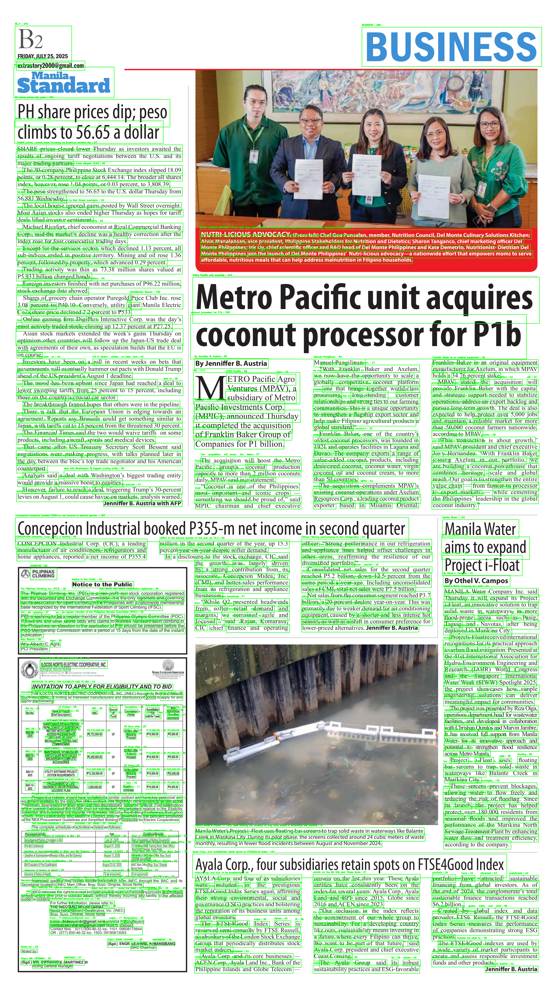

In [27]:
image_path = "./imgs/page_56.png"
# Run OCR
results = reader.readtext(image_path, width_ths = 0.9, height_ths = 0.9, slope_ths = 0.5)

# Annotate and display
img_result = draw_ocr_annotations(image_path, results)

In [28]:

API_KEY = os.getenv("API_KEY")

img_for_prompt = Image.open(img_result)

genai.configure(api_key=API_KEY) 

json_sample = {
    "values" : [
          {
        "type" : "headline",
        "text" : "nLOUSe tO OMEN DicamM to pulDllic",
        "size" : 150
        },
        {
        "type": "byline",
        "text": "By Ramon Manzon",
        "size" : 80
        }
    
    ]
}
prompt = [
    img_for_prompt,
    f""" 
    Can you please help me identify the headlines and byline of each article in this newspaper image? Return them in the same json format that I will provide. Ensure that each object only contains the type (headlines, byline) , the text and its respective font size pixel-wise. (P.S : Can you convert '' instead of ‘’ when you find an instance of its usage. | For detecting bylines, it typically starts with "By" then human name. It may also be found at the end of the body, with just the name written. Use this as the pattern for detecting it). Thank you!:
    {json.dumps(json_sample)}
    """
]
model = genai.GenerativeModel("models/gemini-2.5-flash")
response = model.generate_content(prompt)

print(response.text.strip("```json"))

my_dict = json.loads(response.text.strip("```json"))







{
  "values": [
    {
      "type": "headline",
      "text": "PH share prices dip; peso climbs to 56.65 a dollar",
      "size": 25
    },
    {
      "type": "byline",
      "text": "Jennifer B. Austria with AFP",
      "size": 10
    },
    {
      "type": "headline",
      "text": "Metro Pacific unit acquires coconut processor for P1b",
      "size": 39
    },
    {
      "type": "byline",
      "text": "By Jenniffer B. Austria",
      "size": 10
    },
    {
      "type": "byline",
      "text": "Jennifer B. Austria with AFP",
      "size": 10
    },
    {
      "type": "headline",
      "text": "Concepcion Industrial booked P355-m net income in second quarter",
      "size": 25
    },
    {
      "type": "byline",
      "text": "Jenniffer B. Austria",
      "size": 10
    },
    {
      "type": "headline",
      "text": "Manila Water aims to expand Project i-Float",
      "size": 25
    },
    {
      "type": "byline",
      "text": "By Othel V. Campos",
      "size": 10
    },


In [29]:
def find_bbox_for_gemini_text(target_text, ocr_results, lowest_bbox=0):
    print("\n\n\n")
    target_norm = target_text
    best_match = []
    best_score = 0
    text_match = ""
    best_result = DefaultResultHolder()
    best_height = 0
    multiple_text_match = []
    multiple_height_match = []
    print(f"Target Text: {target_text}")
    # Try single lines first
    for bbox, ocr_text, conf in ocr_results:
        
        if len(ocr_text) >= 4 and len(ocr_text) - len(target_text) <= 5:
            ocr_norm = ocr_text
            result = fuzz.partial_ratio_alignment(ocr_norm, target_text)
            score = result.score
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(f"Single Line Result: {ocr_text} : {score}")
            current_height = abs(bbox[0][1] - bbox[3][1])
            if score > 85 and best_height < current_height:
                best_height = current_height
                best_match = [bbox]
                text_match = ocr_text
                best_result = result
                # break
    if target_text == "Phivolcs lowers Kanlaon alert level":
        print(f"Best Single Line: {text_match}")
    # Check if there is a bigger height for that text
    for bbox, ocr_text, conf in ocr_results:
        result = fuzz.partial_ratio_alignment(ocr_text, text_match)
        current_height = abs(bbox[0][1] - bbox[3][1])
        if len(ocr_text) >= 4 and len(ocr_text) - len(text_match) <= 5: # 5 is the threshold to limit the quantity of characters
            score = result.score
            if score > 95 and best_height < current_height:
                best_height = current_height
                best_match = [bbox]
                text_match = ocr_text
                best_result = result
    
    if target_text == "Phivolcs lowers Kanlaon alert level":
        print(f"Best Single Line (after height): {text_match}")
    # Try multi-line combinations
    new_target_text = remove_single_line_from_target(best_result, target_norm)
    if target_text == "Phivolcs lowers Kanlaon alert level":
        print(f"Best Multiple text match (after height): {multiple_text_match}")
    if text_match.strip() == "":
        return None, 0, lowest_bbox
    multiple_text_match.append(text_match)
    multiple_height_match.append(best_height)
    print(f"Best Single Line: {multiple_text_match[0]}\nBest Height: {multiple_height_match[0]}")
    print(f"New Target Text: {new_target_text}")
    for i in range(len(ocr_results)):
        combined_text = ocr_results[i][1]
        combined_bbox = ocr_results[i][0]
        if target_text == "Phivolcs lowers Kanlaon alert level":
            print(f"Ocr Result: {combined_text}")
        match_found = False
        match_idx = None
        combined_height = abs(combined_bbox[0][1] - combined_bbox[3][1])
        for i in range(1, len(multiple_text_match)):
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(multiple_text_match[i])
            match_ratio = fuzz.partial_ratio_alignment(combined_text, multiple_text_match[i])
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(match_ratio.score)
            if match_ratio.score > 80 and abs(len(multiple_text_match[i]) - len(combined_text)) <= 3 and combined_height > multiple_height_match[i]:
                match_found = True
                match_idx = i
                break
        
        if match_found:
                # Plus 1 is because single line match already occupies first index
                multiple_text_match[match_idx] = combined_text
                best_match[match_idx] = combined_bbox
                multiple_height_match[match_idx] = combined_height
                continue
        if (len(combined_text) >= 4 
            and new_target_text.strip() != ""
            and len(combined_text) <= len(new_target_text) + 2
            ):
            combined_bboxes = best_match[:]
            combined_bboxes.append(combined_bbox)
            best_result = fuzz.partial_ratio_alignment(combined_text, new_target_text)
            score = best_result.score
            if target_text == "Phivolcs lowers Kanlaon alert level":
                print(score)
            if score >= 85:
                best_score = score
                best_match = combined_bboxes[:]
                text_match += combined_text
                multiple_text_match.append(combined_text)
                if target_text == "Phivolcs lowers Kanlaon alert level":
                    print(f"Multiple Text Match: {multiple_text_match}")
                multiple_height_match.append(combined_height)
                new_target_text = remove_single_line_from_target(best_result, new_target_text)
                if target_text == "Phivolcs lowers Kanlaon alert level":
                    print(f"New Target Text: {new_target_text}")
              
    if not best_match:
        return None, 0, lowest_bbox

    # Merge bboxes into one rectangle
    all_points = np.vstack(best_match)
    x_min, y_min = np.min(all_points, axis=0)
    x_max, y_max = np.max(all_points, axis=0)

    # ✅ update lowest bbox using bottom of rectangle
    lowest_bbox = y_min

    return [int(x_min), int(y_min), int(x_max), int(y_max)], best_score, lowest_bbox

In [30]:
from math import dist
def remove_single_line_from_target(best_result, main_text):
    new_result = main_text[best_result.dest_start:best_result.dest_end]
    return main_text.replace(new_result, "")
def find_bbox_for_gemini_text(target_text, ocr_results, lowest_bbox=0):
    print('\n')
    print("=" * 80)
    best_match = []
    best_match_bbox = []
    best_score = 0
    best_result = DefaultResultHolder()
    overall_result = {"texts": {},
                      "bbox": {}}
    print(f"Target Text: {target_text}")
    # Words that fit in the headline
    for idx, (bbox, ocr_text, conf) in enumerate(ocr_results):
        result = fuzz.partial_ratio_alignment(ocr_text, target_text)
        if result.score > 90:
            overall_result["texts"][idx] = ocr_text
            overall_result["bbox"][idx] = [[int(x), int(y)] for (x, y) in bbox]
    

    print(f"Best Matches: {json.dumps(overall_result.get('texts'), indent=1)}")
    # print(f"Best Matches Bbox: {json.dumps(overall_result.get('bbox'), indent= 1)}")


    # Proximity Checker | Euclidean Distance w/ Size Normalizer
    def bbox_center(bbox):
        xs = [p[0] for p in bbox]
        ys = [p[1] for p in bbox]
        return ((sum(xs)/4), (sum(ys)/4))
    def size(bbox):
        ys = [p[1] for p in bbox]
        return max(ys) - min(ys)
    def euc_dist_score(bbox1, bbox2):
        distance = dist(bbox_center(bbox1), bbox_center(bbox2))
        height1, height2 = size(bbox1), size(bbox2)
        # The closer to 1, the more alike their size
        size_ratio = max(height1, height2) / (min(height1, height2) or 1e-6)
        return distance * size_ratio
    def combine_bboxes(bbox1, bbox2):
        # Flatten all points from both bboxes
        try:
            all_points = bbox1 + bbox2
        except:
            return None
    

        xs = [p[0] for p in all_points]
        ys = [p[1] for p in all_points]

        min_x, max_x = min(xs), max(xs)
        min_y, max_y = min(ys), max(ys)

        # Return as a rectangular bbox with 4 corners
        return [
            [min_x, min_y],  # top-left
            [max_x, min_y],  # top-right
            [max_x, max_y],  # bottom-right
            [min_x, max_y]   # bottom-left
        ]

    first_word = ""
    second_word = ""
    best_dist_score = float("inf")
    texts_holder = overall_result["texts"]
    texts_idx = list(overall_result["texts"].keys())
    current_bbox = [None, None]
    included_bbox_idx = [None, None]
    included_texts = [None, None]
    one_line_found = False
    best_ratio = 0
    # for identifying the first two bbox
    for i in range(len(texts_holder.values())):
        one_line_found = fuzz.partial_ratio_alignment(overall_result["texts"][texts_idx[i]], target_text).score > 95 and fuzz.ratio(overall_result["texts"][texts_idx[i]], target_text) > 95
        print(one_line_found)
        if one_line_found:
            included_texts = [overall_result["texts"][texts_idx[i]]]
            included_bbox_idx = [texts_idx[i]]
            break
        for j in range(i+1, len(texts_holder.values())):
            current_distance = euc_dist_score(overall_result["bbox"][texts_idx[i]],overall_result["bbox"][texts_idx[j]])
            current_result = fuzz.ratio(f"{overall_result["texts"][texts_idx[i]]} {overall_result["texts"][texts_idx[j]]}", target_text)
            print(f"Current Word: {overall_result["texts"][texts_idx[i]]} {overall_result["texts"][texts_idx[j]]}")
            print(f"Current Distance: {current_distance}")
            print(f"Current Result: {current_result} || {best_ratio}")
            if current_distance < best_dist_score and current_result > best_ratio:
                first_word = overall_result["texts"][texts_idx[i]]
                second_word = overall_result["texts"][texts_idx[j]]
                current_bbox[0] =  overall_result["bbox"][texts_idx[i]]
                current_bbox[1] =  overall_result["bbox"][texts_idx[j]]
                best_dist_score = current_distance
                best_ratio = current_result
                included_texts[0], included_bbox_idx[0] = overall_result["texts"][texts_idx[i]], texts_idx[i]
                included_texts[1], included_bbox_idx[1] = overall_result["texts"][texts_idx[j]], texts_idx[j]

    if not one_line_found:
        combined_current_bbox = combine_bboxes(current_bbox[0], current_bbox[1])
        if combined_current_bbox == None:
            return None, 0, lowest_bbox
        print(f"First Bbox: {current_bbox[0]}")
        print(f"Second Bbox: {current_bbox[1]}")
        print(f"Combined Bbox: {combined_current_bbox}")
        print(f"Best First Word: {first_word}")
        print(f"Best Second Word: {second_word}")
        current_result = fuzz.partial_ratio_alignment(" ".join(included_texts), target_text)

        target_text = remove_single_line_from_target(current_result, target_text)
        for key, value in overall_result["texts"].items():
            word_substitute = False
            for i, idx in enumerate(included_bbox_idx):
                current_result = fuzz.partial_ratio_alignment(value, overall_result["texts"][idx])
                if current_result.score > 90:
                    included_texts_copy = included_texts.copy()
                    included_texts_copy[i] = value
                    old_distance = euc_dist_score(overall_result["bbox"][key], combined_current_bbox)
                    new_distance = euc_dist_score(overall_result["bbox"][idx], combined_current_bbox)
                    # new_result > old_result and 
                    if new_distance > old_distance:
                        included_texts = included_texts_copy
                        included_bbox_idx[i] = key
                        word_substitute = True
                        break
            if word_substitute:
                continue
            current_result = fuzz.partial_ratio_alignment(value, target_text)
            if current_result.score > 90:
                included_texts.append(value)
                included_bbox_idx.append(key)
                target_text = remove_single_line_from_target(current_result, target_text)
        
    print(f"Final Included Texts: {included_texts}")
                
  
    best_match_bbox = [overall_result["bbox"][i] for i in included_bbox_idx]
    
    # Merge bboxes into one rectangle
    all_points = np.vstack(best_match_bbox)
    x_min, y_min = np.min(all_points, axis=0)
    x_max, y_max = np.max(all_points, axis=0)

    # ✅ update lowest bbox using bottom of rectangle
    lowest_bbox = y_min

    return [int(x_min), int(y_min), int(x_max), int(y_max)], best_score, lowest_bbox

In [31]:
gemini_output = json.loads(response.text.strip("```json"))
draw_annotations_from_gemini_with_ocr(image_path, gemini_output, results)




Target Text: PH share prices dip; peso climbs to 56.65 a dollar
Best Matches: {
 "4": "PH share prices dip; peso",
 "5": "climbs to 56.65 a dollar",
 "356": "sha"
}
False
Current Word: PH share prices dip; peso climbs to 56.65 a dollar
Current Distance: 158.15852143233397
Current Result: 100.0 || 0
Current Word: PH share prices dip; peso sha
Current Distance: 48264.56565437584
Current Result: 70.88607594936708 || 100.0
False
Current Word: climbs to 56.65 a dollar sha
Current Distance: 38366.51276282804
Current Result: 61.53846153846154 || 100.0
False
First Bbox: [[101, 671], [1148, 671], [1148, 857], [101, 857]]
Second Bbox: [[98, 815], [1103, 815], [1103, 967], [98, 967]]
Combined Bbox: [[98, 671], [1148, 671], [1148, 967], [98, 967]]
Best First Word: PH share prices dip; peso
Best Second Word: climbs to 56.65 a dollar
Final Included Texts: ['PH share prices dip; peso', 'climbs to 56.65 a dollar']


Target Text: Jennifer B. Austria with AFP
Best Matches: {
 "48": "By Jenniffer B. Au

{'values': [{'headline': 'PH share prices dip; peso climbs to 56.65 a dollar',
   'byline': 'Jennifer B. Austria with AFP',
   'headline_coord': [98, 671, 1148, 967],
   'byline_coord': [698, 3377, 1231, 3420]},
  {'headline': 'Metro Pacific unit acquires coconut processor for P1b',
   'byline': 'Jennifer B. Austria with AFP',
   'headline_coord': [1287, 1871, 3644, 2423],
   'byline_coord': [698, 3377, 1231, 3420]},
  {'headline': 'Concepcion Industrial booked P355-m net income in second quarter',
   'byline': 'Jenniffer B. Austria',
   'headline_coord': [103, 3493, 2762, 3656],
   'byline_coord': [3277, 6520, 3636, 6563]},
  {'headline': 'Manila Water aims to expand Project i-Float',
   'byline': 'By Othel V. Campos',
   'headline_coord': [2983, 3507, 3578, 3886],
   'byline_coord': [2994, 3884, 3446, 3960]},
  {'headline': 'Ayala Corp., four subsidiaries retain spots on FTSE4Good Index',
   'byline': 'Jenniffer B. Austria',
   'headline_coord': [1301, 5764, 3424, 5925],
   'byline_c